### <span style = 'color:grey'> Introduction: </span> Glasses detection plays an important role in face recognition and soft biometrices for person identification. However, automatic glasses detection is still a challenging problem under real application scenarios, because face variations, light conditions, and self-occlusion, have significant influence on its performance.

### <span style = 'color:red'>Objective</span>: Create a deep learning algorithm that can diffrentiate the people with eye glasses and without eye glasses on facial analysis 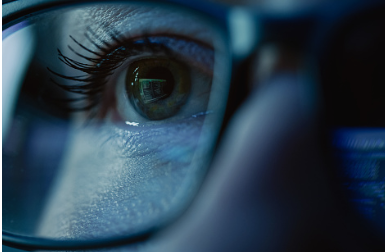 






#### For dataset <a href="https://drive.google.com/drive/folders/11MajaKB5T0cHRx5aXo9F72Un7hHqTCpA" title="Glasses dataset">   Click here</a>


**Outcomes of the Project**
- There are two diffrent classes in the dataset, Try to display the images of each class.
- Use CNN for model building.
- Explain the parameters in CNN and how it will alter the model building.
- Draw inference on Image augmentation.
- Draw inference on epochs and batch sizes.
- CNN model should be able to classify the people with and without glasses.

In [32]:
# import libraries
import matplotlib.pyplot as plt
import os
from PIL import Image
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing import image
import numpy as np
import sys

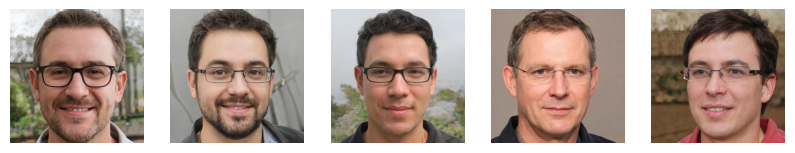

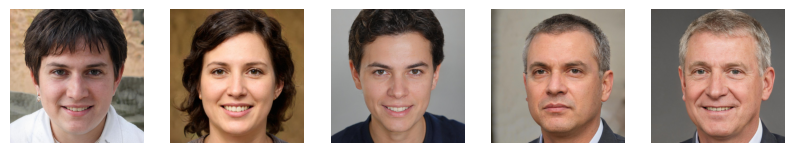

In [13]:
# get the data from dataset
def display_samples(dataset_dir, folder_name, num_samples=5):
    class_dir = os.path.join(dataset_dir, folder_name)
    sample_images = os.listdir(class_dir)[:num_samples]
    plt.figure(figsize=(10, 5))
    for i, image_name in enumerate(sample_images):
        img_path = os.path.join(class_dir, image_name)
        img = Image.open(img_path)
        plt.subplot(1, num_samples, i+1)
        plt.imshow(img)
        plt.axis('off')
    plt.show() # print some images from dataset

# getting images from dataset
dataset_dir = 'C:/Data Science/glasses'
display_samples(dataset_dir, 'glasses')
display_samples(dataset_dir, 'no_glasses')

In [18]:
# build model use CNN


# Set same size to all image
image_height = 128  
image_width = 128   

# ImageDataGenerator with image resizing
datagen = ImageDataGenerator(rescale=1./255, validation_split=0.2)

train_generator = datagen.flow_from_directory(
    'C:/Data Science/glasses',  # Path to dataset
    target_size=(image_height, image_width), 
    batch_size=32,
    class_mode='binary',
    subset='training'  # Use for training the data
)

validation_generator = datagen.flow_from_directory(
    'C:/Data Science/glasses',
    target_size=(image_height, image_width),
    batch_size=32,
    class_mode='binary',
    subset='validation'  # Use this for validation data
)

# Build the CNN model with defined image size
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(image_height, image_width, 3)),
    MaxPooling2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(1, activation='sigmoid')
])

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Summary of the model
model.summary()

# Train the model
history = model.fit(
    train_generator,
    epochs=10, 
    batch_size=32, 
    validation_data=validation_generator
)

# Save the model if needed
model.save('glasses_detection_model.h5')

Found 69 images belonging to 2 classes.
Found 17 images belonging to 2 classes.


Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_12 (Conv2D)                   │ (None, 126, 126, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_12 (MaxPooling2D)      │ (None, 63, 63, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_13 (Conv2D)                   │ (None, 61, 61, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_13 (MaxPooling2D)      │ (None, 30, 30, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_14 (Conv2D)                   │ (None, 28, 28, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_14 (MaxPooling2D)      │ (None, 14, 14, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_4 (Flatten)                  │ (None, 25088)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_8 (Dense)                      │ (None, 128)                 │       3,211,392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_9 (Dense)                      │ (None, 1)                   │             129 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,304,769 (12.61 MB)

 Trainable params: 3,304,769 (12.61 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 806ms/step - accuracy: 0.5835 - loss: 0.8084 - val_accuracy: 0.7059 - val_loss: 0.6146
Epoch 2/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 404ms/step - accuracy: 0.6892 - loss: 0.6500 - val_accuracy: 0.7059 - val_loss: 0.6344
Epoch 3/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 410ms/step - accuracy: 0.7496 - loss: 0.6212 - val_accuracy: 0.7059 - val_loss: 0.6048
Epoch 4/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 552ms/step - accuracy: 0.7375 - loss: 0.5730 - val_accuracy: 0.7059 - val_loss: 0.5823
Epoch 5/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 418ms/step - accuracy: 0.7037 - loss: 0.5657 - val_accuracy: 0.7059 - val_loss: 0.5524
Epoch 6/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 403ms/step - accuracy: 0.6954 - loss: 0.5428 - val_accuracy: 0.7059 - val_loss: 0.5219
Epoch 7/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 547ms/step - accuracy: 0.7880 - loss: 0.4132 - val_accuracy: 0.7059 - val_loss: 0.4455
Epoch 8/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 549ms/step - accuracy: 0.7933 - loss: 0.4544 - val_accuracy: 0.8824 - val_loss:

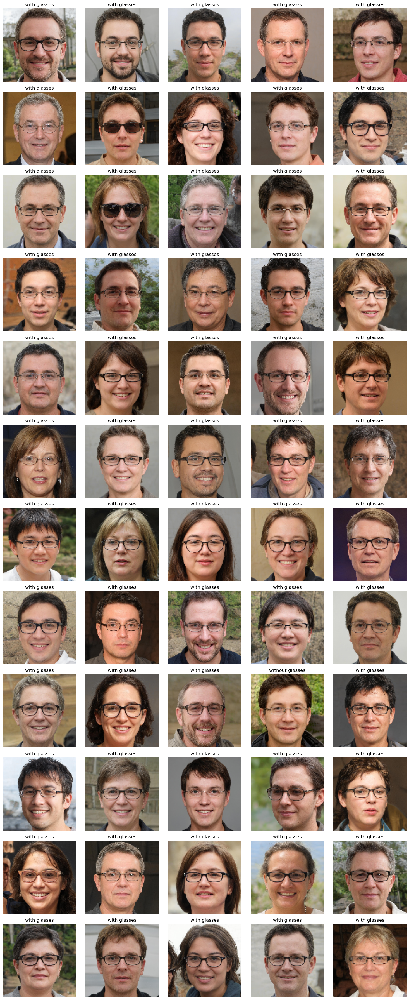

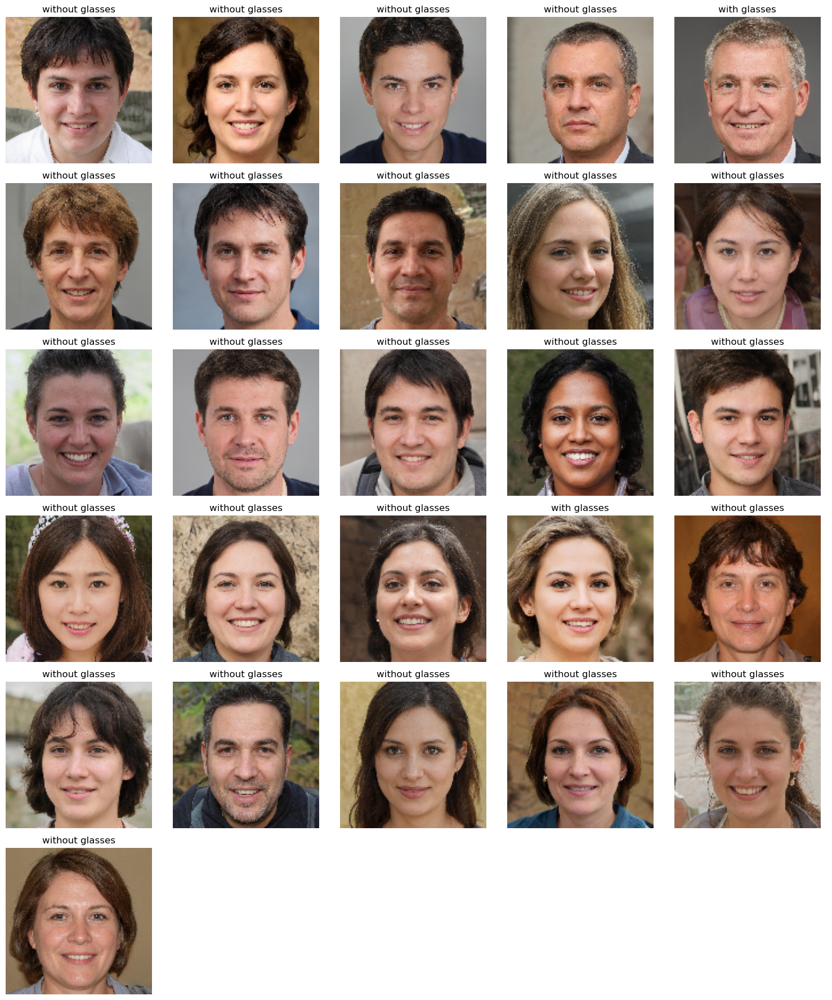

In [36]:
# remove TensorFlow warnings and progress output

tf.get_logger().setLevel('ERROR')
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'

# Function to load and preprocess the image
def load_and_preprocess_image(img_path, target_size=(128, 128)):
    img = image.load_img(img_path, target_size=target_size)
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0) 
    img_array /= 255.0 
    return img_array

# Function to predict and display images
def predict_and_display_images(folder_path, title):
    # Create a figure with subplots
    image_paths = [os.path.join(folder_path, img_name) for img_name in os.listdir(folder_path)]
    num_images = len(image_paths)
    
    # Determine the number of rows and columns for subplots
    ncols = 5
    nrows = (num_images + ncols - 1) // ncols  # Calculate rows needed
    
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15, 3 * nrows))
    axes = axes.flatten() if num_images > 0 else []
    
    for i, img_path in enumerate(image_paths):
        img_array = load_and_preprocess_image(img_path)
        
        # Predict without suppressing output
        result = model.predict(img_array, verbose=0)
        
        # Classification based on the result
        label = "without glasses" if result > 0.5 else "with glasses"
        
        # Display the image
        img = image.load_img(img_path, target_size=(128, 128))
        axes[i].imshow(img)
        axes[i].axis('off')
        axes[i].set_title(label)
    
    # Hide any unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')
    
    plt.suptitle(title)
    plt.tight_layout()
    plt.show()

# check images from the 'glasses' folder
predict_and_display_images(glasses_folder, "")

# check images from the 'no_glasses' folder
predict_and_display_images(no_glasses_folder, "")